In [1]:
import torch.nn.functional as F
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import plotly.express as px
import plotly.graph_objects as go
import torchvision.transforms as transforms
import torchvision.models as models
import random
import os
from tqdm import tqdm
device = 'cuda'

In [2]:
train = pd.read_csv('/kaggle/input/facial-keypoints-detection/training.zip', compression='zip')
test = pd.read_csv('/kaggle/input/facial-keypoints-detection/test.zip', compression='zip')
IdLookupTable = pd.read_csv('/kaggle/input/facial-keypoints-detection/IdLookupTable.csv',header=0, sep=',', quotechar='"')

In [3]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:8192"

In [4]:
img_size = 96

In [5]:
def get_img(train,img_size):
    img = []
    # Iterate over all the rows and extract images:
    for i in range(len(train)):
        face_pixel = np.array(train['Image'].iloc[i].split(' '), dtype='float')
        # add dimension to each image
        face_pixel = np.reshape(face_pixel, (img_size, img_size,1))
        # scale pixel values to be from 0 to 1:
        face_pixel /=255
        # add image to images array
        img.append(face_pixel)
    img = np.array(img)
    return img


In [6]:
img = get_img(train, img_size)
img_submission = get_img(test, img_size)

In [7]:
y_train = train.drop('Image', axis=1).values.astype('float')

In [8]:
def show_images(img_size, image1, keypoints_true1, keypoints1=None, image2=None, keypoints_true2=None, keypoints2=None, ):
    # Create a figure and axes object
    fig, ax = plt.subplots(nrows=1, ncols=2)

    # Display the first image on the axes
    ax[0].imshow(image1, cmap='gray')
    if keypoints1 is not None:
        ax[0].scatter(keypoints1[0::2], keypoints1[1::2], s=30, marker='.', c='r')
    ax[0].scatter(keypoints_true1[0::2], keypoints_true1[1::2], s=30, marker='.', c='g')
    ax[0].set_xlim(0, img_size)
    ax[0].set_ylim(img_size, 0)

    # If a second image is provided, display it on the axes
    if image2 is not None and keypoints_true2 is not None:
        ax[1].imshow(image2, cmap='gray')
        if keypoints2 is not None:
            ax[1].scatter(keypoints2[0::2], keypoints2[1::2], s=30, marker='.', c='r')
        ax[1].scatter(keypoints_true2[0::2], keypoints_true2[1::2], s=30, marker='.', c='g')
        ax[1].set_xlim(0, img_size)
        ax[1].set_ylim(img_size, 0)

    # Show the plot
    plt.show()

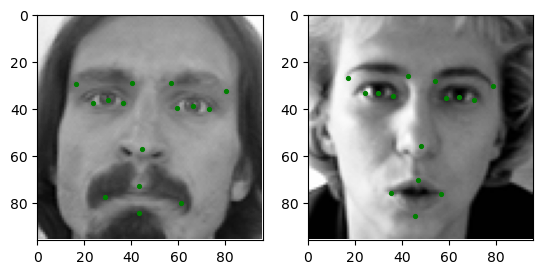

In [9]:
show_images(img_size, img[0], y_train[0], None, img[1], y_train[1], None)

## Transforms

In [10]:
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1., p=0.25):
        self.std = std
        self.mean = mean
        self.p = p

    def __call__(self, tensor):
        if np.random.uniform() < self.p:
          return tensor + torch.randn(tensor.size()).to(device) * self.std + self.mean
        else:
          return tensor


class AddGaussianBlur(object):
    def __init__(self, kernel_size=(7, 7), sigma=(0.01, 1.5), p=0.25):
        self.transform = transforms.GaussianBlur(kernel_size=kernel_size, sigma=sigma)
        self.p = p

    def __call__(self, img):
        if np.random.uniform() < self.p:
            img = self.transform(img)
        return img


class AdjustBrightness(object):
    def __init__(self, brightness_range=(-0.2, 0.2), p=0.25):
        self.brightness_range = brightness_range
        self.p = p

    def __call__(self, tensor):
        if np.random.uniform() < self.p:
            # Random brightness factor within the specified range
            brightness_factor = np.random.uniform(*self.brightness_range)

            # Adjust brightness
            brightness_tensor = tensor + brightness_factor

            return brightness_tensor
        else:
            return tensor


class AdjustContrast(object):
    def __init__(self, contrast_range=(0.5, 1.5), p=0.25):
        self.contrast_range = contrast_range
        self.p = p

    def __call__(self, tensor):
        if np.random.uniform() < self.p:
            # Random contrast factor within the specified range
            contrast_factor = np.random.uniform(*self.contrast_range)

            # Adjust contrast
            mean = tensor.mean()
            contrast_tensor = (tensor - mean) * contrast_factor + mean

            return contrast_tensor
        else:
            return tensor


class InvertGrayscale(object):
    def __init__(self, p=0.25):
        self.p = p

    def __call__(self, tensor):
        if np.random.uniform() < self.p:

            # Adjust brightness
            inverted_tensor = -1 * (tensor - 0.5) + 0.5

            return inverted_tensor
        else:
            return tensor


def transform_label_rotate(label, angles, img_size):
    # Apply rotation to label
    newpred = np.zeros(label.shape)
    rads = np.radians(angles)
    newpred[0::2] = (label[0::2] - img_size/2)*np.cos(rads) + (label[1::2]- img_size/2)*np.sin(rads) + img_size/2
    newpred[1::2] = - (label[0::2] - img_size/2)*np.sin(rads) + (label[1::2]- img_size/2)*np.cos(rads) + img_size/2
    return newpred


def transform_label_shift(label, shift_x, shift_y, img_size):
    # Apply shift to label
    newpred = np.zeros(label.shape)
    newpred[0::2] = label[0::2] + shift_x
    newpred[1::2] = label[1::2] + shift_y
    return newpred

def transform_label_scale(label, factor, img_size):
    # Apply scale to label
    newpred = np.zeros(label.shape)
    newpred[0::2] = (label[0::2] - img_size/2) * factor + img_size/2
    newpred[1::2] = (label[1::2] - img_size/2) * factor + img_size/2
    return newpred


class ToTensor(object):
    def __call__(self, image):
        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        image = torch.from_numpy(image)
        return image

# Define the transformations for the dataset
transform_image_train = transforms.Compose([
    transforms.ToTensor(),
    InvertGrayscale(p=0.1), # Invert image
    transforms.Lambda(lambda x: x.repeat(3, 1, 1)),  # Repeat the grayscale image to have 3 channels
    transforms.Lambda(lambda x: x.float().to(device)),
    AddGaussianBlur(kernel_size=(7, 7), sigma=(0.01, 1.5), p=0.25),  # Apply Gaussian blur with probability
    AddGaussianNoise(mean=0., std=0.2, p=0.25),  # Add Gaussian noise with probability
    AdjustContrast(p=0.25), # Adjust contrast with probability
    transforms.Normalize(mean=[0.4897,0.4897,0.4897], std = [0.2330,0.2330,0.2330]),  # Normalize the image
    AdjustBrightness(p=0.25), # Adjust brightness  with probability    
])


transform_image_test = transforms.Compose([
    # convert numpy image to tensor image
    transforms.ToTensor(),
    # Repeat the grayscale image to have 3 channels
    transforms.Lambda(lambda x: x.repeat(3, 1, 1)),
    # Image normalization
    transforms.Normalize(mean=[0.4897,0.4897,0.4897], std = [0.2330,0.2330,0.2330]),
    # Convert tensor to float type and move to cuda device
    transforms.Lambda(lambda x: x.float().to(device))
])


class CombinedTransform(object):
    def __init__(self):
        # Initialize augmentation params:
        self.range_angle = 180
        self.shift_pixel = img_size // 5
        self.scale_min = 0.6
        self.scale_max = 1.5
        self.p_aff = 0.3
        self.p_rot = 0.3

    def __call__(self, image, keypoints):

        # keypoints[np.isnan(keypoints)] = -1

        # Apply random rotation if probability condition is met
        if np.random.uniform() < self.p_rot:
            angles = np.random.uniform(-self.range_angle/2, self.range_angle/2)
        else:
            angles = 0

        # Apply scale rotation if probability condition is met
        if np.random.uniform() < self.p_aff:
            factors = np.random.uniform(self.scale_max, self.scale_min)
        else:
            factors = 1

        # Apply random shift if probability condition is met
        if np.random.uniform() < self.p_aff:
            shifts_x = np.random.uniform(-self.shift_pixel, self.shift_pixel)
            shifts_y = np.random.uniform(-self.shift_pixel, self.shift_pixel)
        else:
            shifts_x = 0
            shifts_y = 0

        # Apply affine transformation to the image
        image = transforms.functional.affine(
            image,
            angle=-angles,
            scale=factors,
            translate=(shifts_x, shifts_y),
            shear=0)

        # Apply corresponding transformation to keypoints
        keypoints = transform_label_rotate(keypoints, angles, img_size)
        keypoints = transform_label_scale(keypoints, factors, img_size)
        keypoints = transform_label_shift(keypoints, shifts_x, shifts_y, img_size)

        return image, keypoints

combined_transform = CombinedTransform()


class FK_dataset_train(Dataset):
    def __init__(self, X, y, transform_image=None, transform_combined=None):
        self.X = X
        self.y = y
        self.transform_image = transform_image
        self.transform_combined = transform_combined

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        image = self.X[idx]
        keypoints_orig = self.y[idx]
        keypoints = keypoints_orig.copy()

        if self.transform_image:
            # Apply image transformations
            image = self.transform_image(image)

        if self.transform_combined:
            # Apply image and keypoints transformations
            combined_transform = CombinedTransform()
            image, keypoints = combined_transform(image, keypoints)

        # Set keypoints outside the image boundaries to -1
        keypoints[keypoints < 0] = -1
        keypoints[keypoints > img_size] = -1

        # Set all keypoints that provided without label (NaN) to -1
        keypoints[np.isnan(keypoints_orig)] = -1
        # Fix keypoints data type
        keypoints = torch.from_numpy(keypoints).to(device).float()

        sample = (image, keypoints)

        return sample


class FK_dataset_test(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        image = self.X[idx]
        keypoints = self.y[idx]

        if self.transform:
            # Apply all the desired transformations
            image = self.transform(image)

        # Set all keypoints that provided without label (NaN) to -1
        keypoints[np.isnan(keypoints)] = -1
        # Fix keypoints data type
        keypoints =  torch.from_numpy(keypoints).float().to(device)

        sample = (image, keypoints)
        return sample

## Data Loaders:

In [11]:
# Generate train and val samples:
test_samples = random.sample(range(len(img)), len(img)//20)
train_samples = np.setdiff1d(range(len(img)), test_samples)

# Load the data
train_data  = FK_dataset_train(img[train_samples],
                               y_train[train_samples],
                               transform_image=transform_image_train,
                               transform_combined=combined_transform)

val_data   = FK_dataset_test(img[test_samples],
                             y_train[test_samples],
                             transform=transform_image_test)
# Define batch size
batch_size =  16

# Define dataloaders:
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True)


## MODEL

In [12]:
class MyModel(nn.Module):

    def __init__(self, num_keypoints=30, grad_from = 3, pretrained=True):
        super(MyModel, self).__init__()
        self.effnet = models.efficientnet_b0(pretrained=pretrained) 
      
        for name, param in self.effnet.features.named_parameters():
            if int(name.split('.')[0])<grad_from:
                param.requires_grad = False


        self.regressor = nn.Sequential(
            nn.Dropout(p=0.6),
            nn.Linear(1280*3*3, num_keypoints),
        )
       

    def forward(self, x):
        x = self.effnet.features(x)
        x = torch.flatten(x, 1)
        x = self.regressor(x)

        return x

model = MyModel()
model.to('cuda')

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 124MB/s]


MyModel(
  (effnet): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): MBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
              (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
            (1): SqueezeExcitation(
              (avgpool): AdaptiveAvgPool2d(output_size=1)
              (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (activation): SiLU(inplace=True)
              (scale_activa

In [13]:

def get_predictions(model, img_submission):
    res = []
    model.eval()
    with torch.no_grad():
        for i in img_submission:
            submission_img = transform_image_test(i).unsqueeze(0)
            pred = model(submission_img.to(device))
            pred = pred.detach().cpu().numpy()[0]
            res.append(pred)
    model.train()
    return res

In [14]:
def save_predictions(model, img_submission, IdLookupTable):
    predictions = get_predictions(model, img_submission)
    preds = pd.DataFrame(np.array(predictions))
    preds.columns = train.columns[:-1]
    feature_names = list(IdLookupTable['FeatureName'])
    image_ids = list(IdLookupTable['ImageId']-1)
    row_ids = list(IdLookupTable['RowId'])

    feature_list = []
    for feature in feature_names:
        feature_list.append(feature_names.index(feature))

    submission_result = pd.DataFrame(index = row_ids)
    for t in pd.DataFrame(zip(row_ids, image_ids, feature_names)).itertuples():
        submission_result.loc[t[1], 'location'] = preds.loc[t[2], t[3]].clip(0.0,96.0)
    submission_result = submission_result.reset_index()
    submission_result.columns = ['RowId', 'Location']

    submission_result.to_csv('/kaggle/working/tr_submission_' + str(epoch) + '.csv',index = False)
    return submission_result

Epoch #: 0


100%|██████████| 419/419 [00:21<00:00, 19.08it/s]


Loss on train: 17.40910924020757
Loss on val: 52.14589515801413
LR features: 0.0002 LR regressor: 0.0005


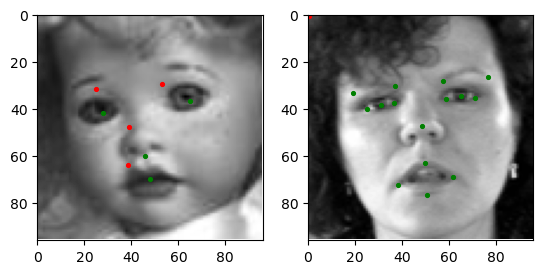


Epoch #: 1


100%|██████████| 419/419 [00:20<00:00, 20.04it/s]


Loss on train: 7.841141064029515
Loss on val: 5.788718868393514
LR features: 0.0002 LR regressor: 0.0005


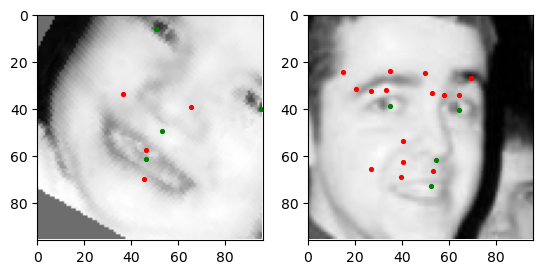


Epoch #: 2


100%|██████████| 419/419 [00:20<00:00, 20.12it/s]


Loss on train: 6.385077481987011
Loss on val: 5.357519222917438
LR features: 0.0002 LR regressor: 0.0005


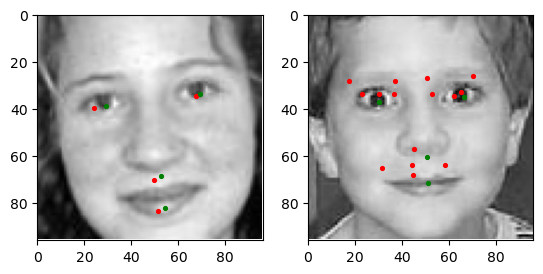


Epoch #: 3


100%|██████████| 419/419 [00:21<00:00, 19.49it/s]


Loss on train: 5.804865537368084
Loss on val: 3.3727532572422767
LR features: 0.0002 LR regressor: 0.0005


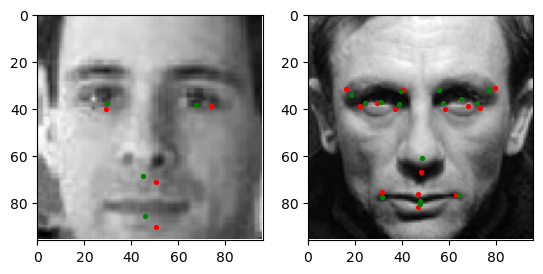


Epoch #: 4


100%|██████████| 419/419 [00:21<00:00, 19.58it/s]


Loss on train: 5.302458545695062
Loss on val: 3.3106640054372
LR features: 0.0002 LR regressor: 0.0005


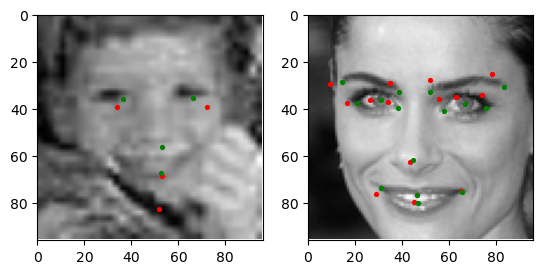


Epoch #: 5


100%|██████████| 419/419 [00:21<00:00, 19.69it/s]


Loss on train: 4.9805685418122065
Loss on val: 2.7776945677143057
LR features: 0.0002 LR regressor: 0.0005


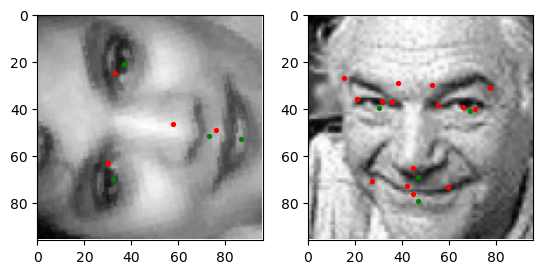


Epoch #: 6


100%|██████████| 419/419 [00:21<00:00, 19.66it/s]


Loss on train: 4.704772790699455
Loss on val: 2.9488045337306805
LR features: 0.0002 LR regressor: 0.0005


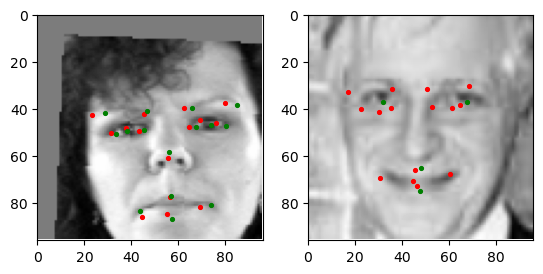


Epoch #: 7


100%|██████████| 419/419 [00:20<00:00, 20.39it/s]


Loss on train: 4.591483978532976
Loss on val: 2.6592542301635866
LR features: 0.0002 LR regressor: 0.0005


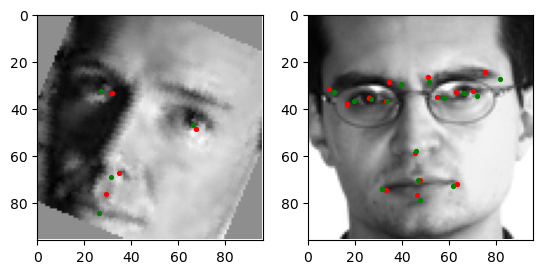


Epoch #: 8


100%|██████████| 419/419 [00:21<00:00, 19.79it/s]


Loss on train: 4.136311260567986
Loss on val: 2.408334137948907
LR features: 0.0002 LR regressor: 0.0005


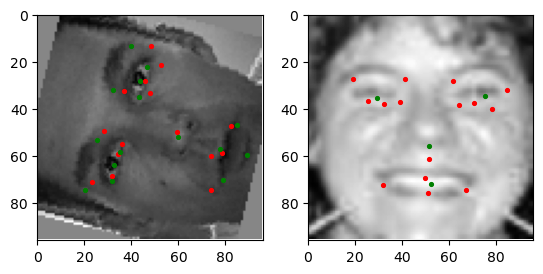


Epoch #: 9


100%|██████████| 419/419 [00:21<00:00, 19.75it/s]


Loss on train: 4.0023620458396945
Loss on val: 2.7285000109668367
LR features: 0.0002 LR regressor: 0.0005


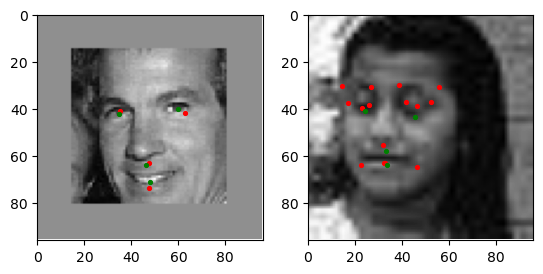


Epoch #: 10


100%|██████████| 419/419 [00:20<00:00, 20.16it/s]


Loss on train: 4.066806849149581
Loss on val: 2.235347880166246
LR features: 0.0002 LR regressor: 0.0005


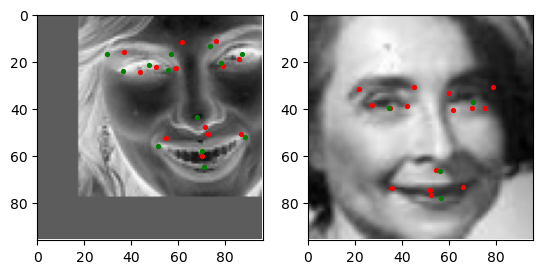


Epoch #: 11


100%|██████████| 419/419 [00:21<00:00, 19.70it/s]


Loss on train: 3.8705835496162444
Loss on val: 2.3362295384866636
LR features: 0.0002 LR regressor: 0.0005


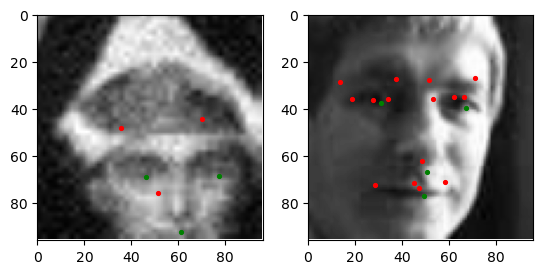


Epoch #: 12


100%|██████████| 419/419 [00:21<00:00, 19.64it/s]


Loss on train: 3.928778609991358
Loss on val: 2.228972263352341
LR features: 0.0002 LR regressor: 0.0005


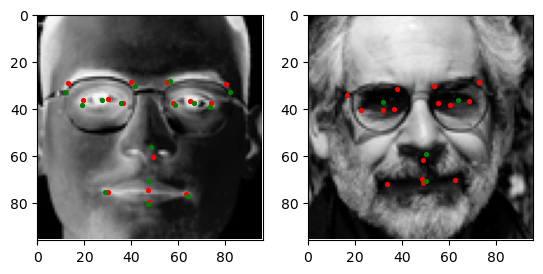


Epoch #: 13


100%|██████████| 419/419 [00:21<00:00, 19.35it/s]


Loss on train: 3.58969211477119
Loss on val: 2.462453485233182
LR features: 0.0002 LR regressor: 0.0005


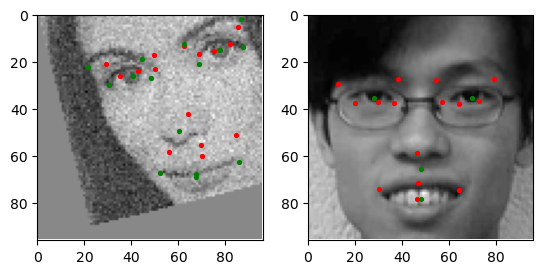


Epoch #: 14


100%|██████████| 419/419 [00:21<00:00, 19.68it/s]


Loss on train: 3.6569429973240197
Loss on val: 2.76127067786798
LR features: 0.0002 LR regressor: 0.0005


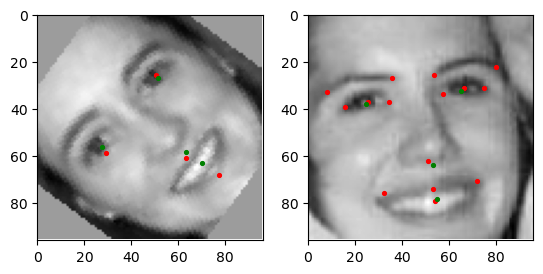


Epoch #: 15


100%|██████████| 419/419 [00:20<00:00, 20.02it/s]


Loss on train: 3.472783875674823
Loss on val: 2.064273630484473
LR features: 0.0002 LR regressor: 0.0005


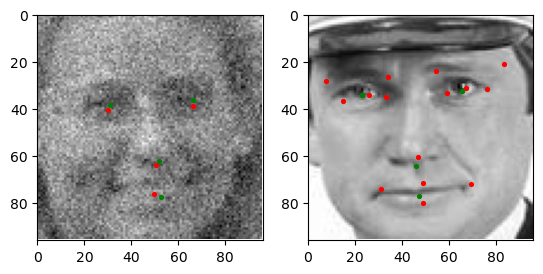


Epoch #: 16


100%|██████████| 419/419 [00:21<00:00, 19.61it/s]


Loss on train: 3.4704762922203845
Loss on val: 1.841308596367967
LR features: 0.0002 LR regressor: 0.0005


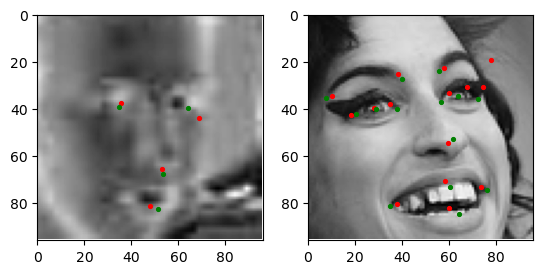


Epoch #: 17


100%|██████████| 419/419 [00:21<00:00, 19.81it/s]


Loss on train: 3.377532452449862
Loss on val: 1.788204094162205
LR features: 0.0002 LR regressor: 0.0005


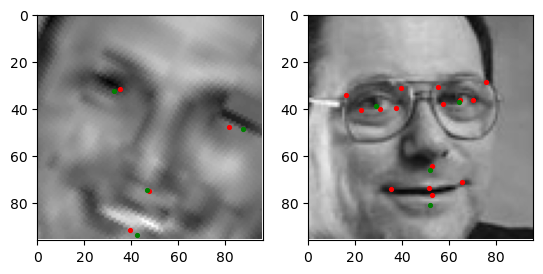


Epoch #: 18


100%|██████████| 419/419 [00:21<00:00, 19.82it/s]


Loss on train: 3.2872262039687756
Loss on val: 1.8284258969061737
LR features: 0.0002 LR regressor: 0.0005


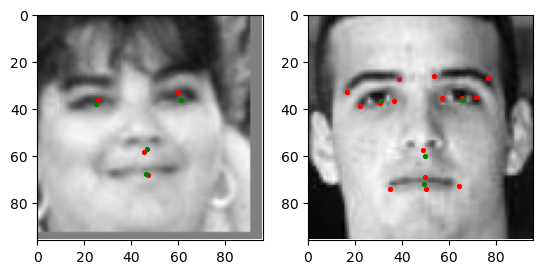


Epoch #: 19


100%|██████████| 419/419 [00:21<00:00, 19.66it/s]


Loss on train: 3.2891948717620765
Loss on val: 1.8816822876574228
LR features: 0.0002 LR regressor: 0.0005


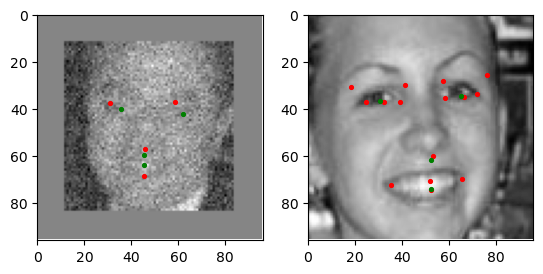


Epoch #: 20


100%|██████████| 419/419 [00:21<00:00, 19.67it/s]


Loss on train: 3.195659436770881
Loss on val: 1.8347356686934828
LR features: 0.0002 LR regressor: 0.0005


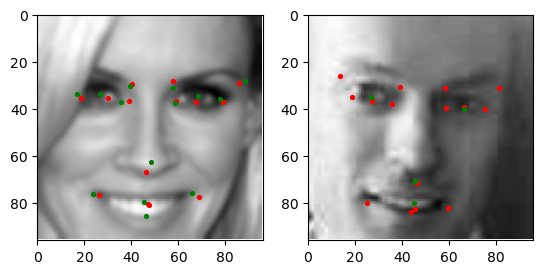


Epoch #: 21


100%|██████████| 419/419 [00:21<00:00, 19.54it/s]


Loss on train: 3.1131278886725195
Loss on val: 1.7375589061534
LR features: 0.0002 LR regressor: 0.0005


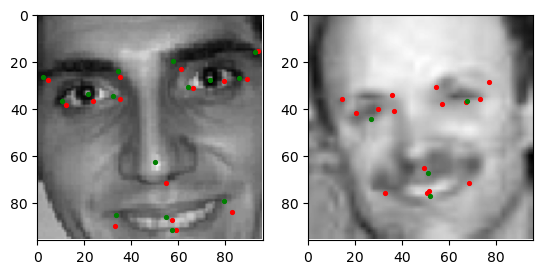


Epoch #: 22


100%|██████████| 419/419 [00:21<00:00, 19.57it/s]


Loss on train: 3.2857253382723246
Loss on val: 1.7501914807756596
LR features: 0.0002 LR regressor: 0.0005


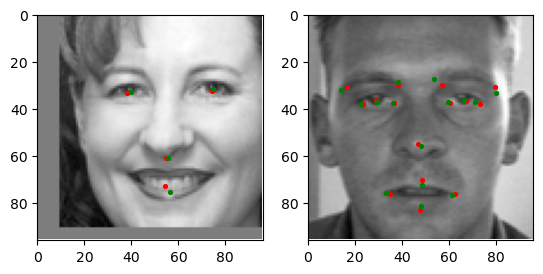


Epoch #: 23


100%|██████████| 419/419 [00:20<00:00, 19.98it/s]


Loss on train: 3.083872290276264
Loss on val: 1.9454393294750023
LR features: 0.0002 LR regressor: 0.0005


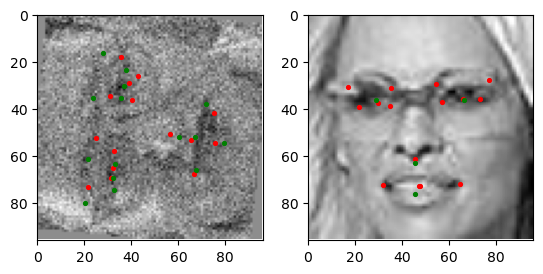


Epoch #: 24


100%|██████████| 419/419 [00:21<00:00, 19.62it/s]


Loss on train: 3.153876419947275
Loss on val: 1.6817144740465302
LR features: 0.0002 LR regressor: 0.0005


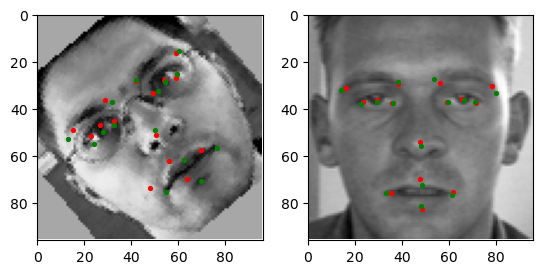


Epoch #: 25


100%|██████████| 419/419 [00:21<00:00, 19.47it/s]


Loss on train: 3.1565560048111303
Loss on val: 1.7882157730211348
LR features: 0.0002 LR regressor: 0.0005


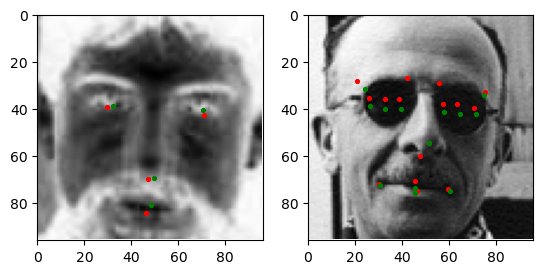


Epoch #: 26


100%|██████████| 419/419 [00:21<00:00, 19.60it/s]


Loss on train: 2.9513770747861483
Loss on val: 1.7017611667426515
LR features: 0.0002 LR regressor: 0.0005


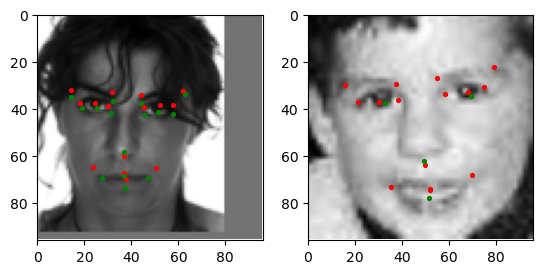


Epoch #: 27


100%|██████████| 419/419 [00:21<00:00, 19.56it/s]


Loss on train: 3.039402897489755
Loss on val: 1.8025622415393374
LR features: 0.0002 LR regressor: 0.0005


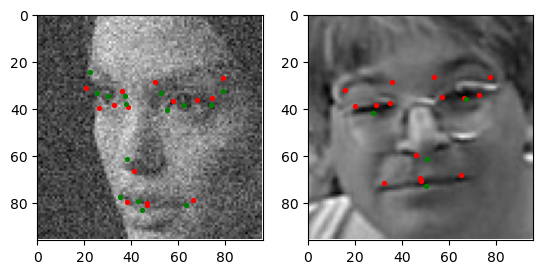


Epoch #: 28


100%|██████████| 419/419 [00:20<00:00, 20.03it/s]


Loss on train: 2.989047923636402
Loss on val: 1.7378517468782593
LR features: 0.0002 LR regressor: 0.0005


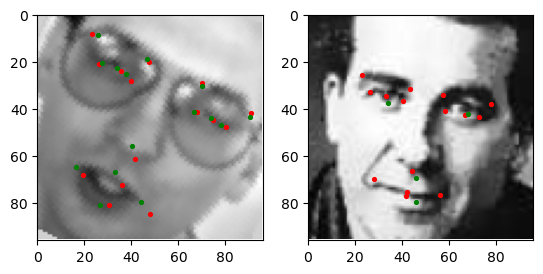


Epoch #: 29


100%|██████████| 419/419 [00:21<00:00, 19.56it/s]


Loss on train: 2.9390105069646246
Loss on val: 2.231528483778536
LR features: 0.0001 LR regressor: 0.00025


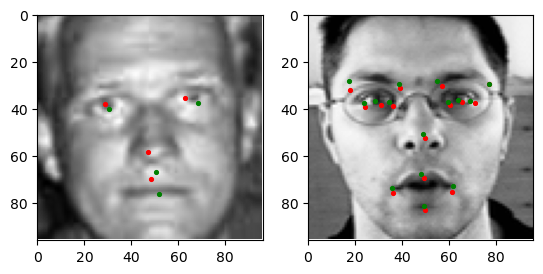


Epoch #: 30


100%|██████████| 419/419 [00:21<00:00, 19.61it/s]


Loss on train: 2.794065929128902
Loss on val: 1.692077925511441
LR features: 0.0001 LR regressor: 0.00025


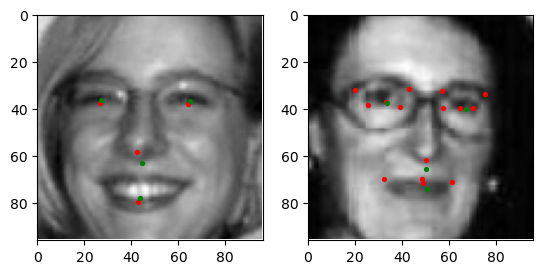


Epoch #: 31


100%|██████████| 419/419 [00:21<00:00, 19.43it/s]


Loss on train: 2.7614250992150096
Loss on val: 1.640259630579636
LR features: 0.0001 LR regressor: 0.00025


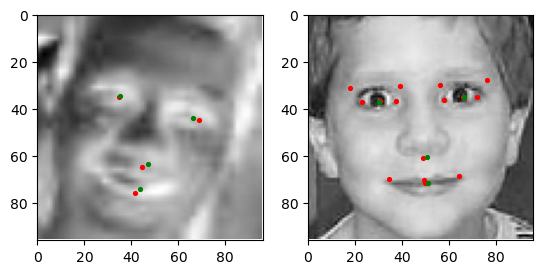


Epoch #: 32


100%|██████████| 419/419 [00:21<00:00, 19.67it/s]


Loss on train: 2.7167552697499877
Loss on val: 1.5527329049701775
LR features: 0.0001 LR regressor: 0.00025


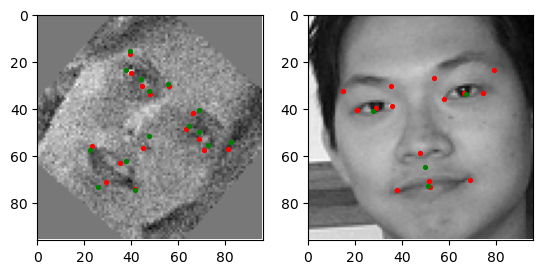


Epoch #: 33


100%|██████████| 419/419 [00:21<00:00, 19.82it/s]


Loss on train: 2.698308781874868
Loss on val: 1.6932303225868757
LR features: 0.0001 LR regressor: 0.00025


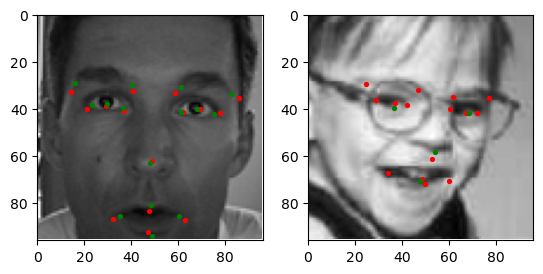


Epoch #: 34


100%|██████████| 419/419 [00:21<00:00, 19.41it/s]


Loss on train: 2.60478411957202
Loss on val: 1.5844499443988886
LR features: 0.0001 LR regressor: 0.00025


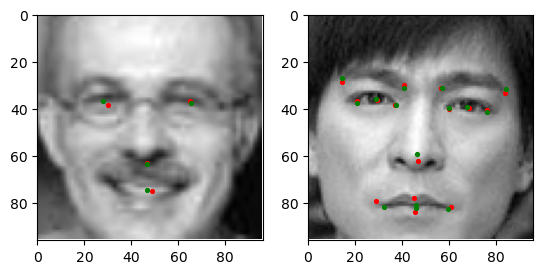


Epoch #: 35


100%|██████████| 419/419 [00:21<00:00, 19.51it/s]


Loss on train: 2.5547161519007315
Loss on val: 1.6078286868471996
LR features: 0.0001 LR regressor: 0.00025


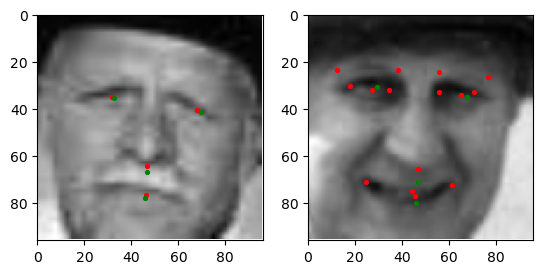


Epoch #: 36


100%|██████████| 419/419 [00:21<00:00, 19.09it/s]


Loss on train: 2.7466213418061702
Loss on val: 1.5438256822247023
LR features: 0.0001 LR regressor: 0.00025


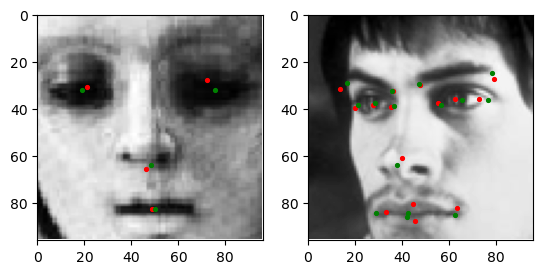


Epoch #: 37


100%|██████████| 419/419 [00:21<00:00, 19.47it/s]


Loss on train: 2.708110015977423
Loss on val: 1.4973828718404338
LR features: 0.0001 LR regressor: 0.00025


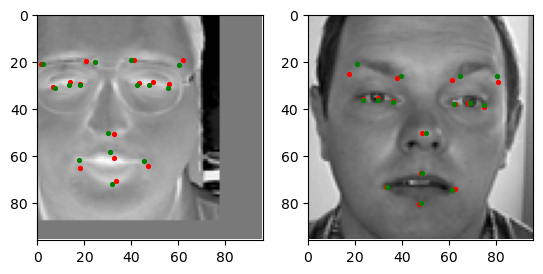


Epoch #: 38


100%|██████████| 419/419 [00:21<00:00, 19.48it/s]


Loss on train: 2.598992425408438
Loss on val: 1.5019841128517284
LR features: 0.0001 LR regressor: 0.00025


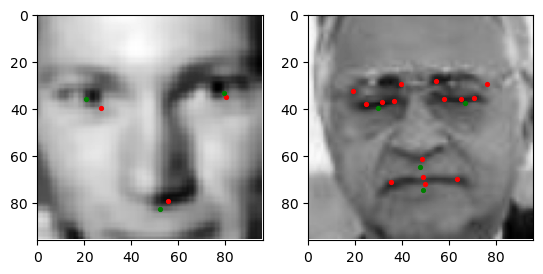


Epoch #: 39


100%|██████████| 419/419 [00:21<00:00, 19.92it/s]


Loss on train: 2.6411287200719196
Loss on val: 1.4849380994719246
LR features: 0.0001 LR regressor: 0.00025


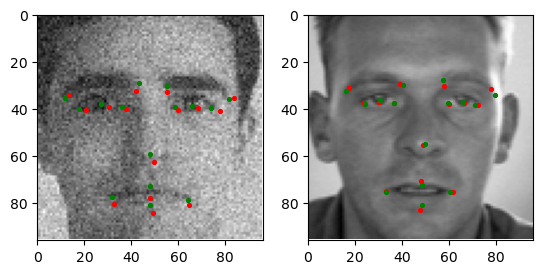


Epoch #: 40


100%|██████████| 419/419 [00:21<00:00, 19.24it/s]


Loss on train: 2.6759593311106564
Loss on val: 1.5154999542042011
LR features: 0.0001 LR regressor: 0.00025


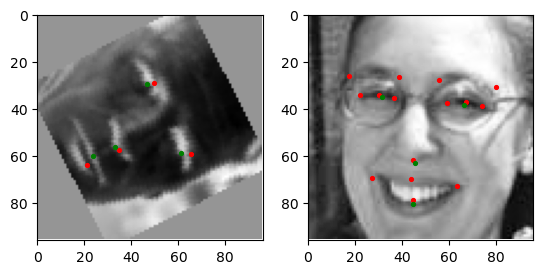


Epoch #: 41


100%|██████████| 419/419 [00:21<00:00, 19.62it/s]


Loss on train: 2.549998683327486
Loss on val: 1.5638896050699447
LR features: 0.0001 LR regressor: 0.00025


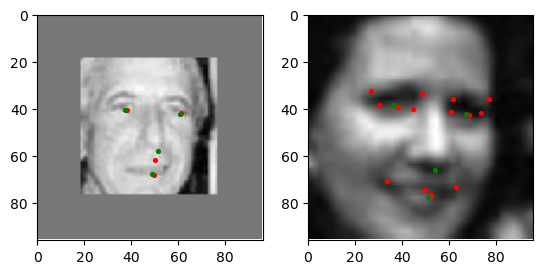


Epoch #: 42


100%|██████████| 419/419 [00:21<00:00, 19.41it/s]


Loss on train: 2.588678300791255
Loss on val: 1.5554262586465957
LR features: 5e-05 LR regressor: 0.000125


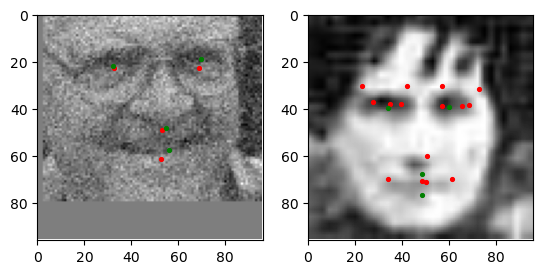


Epoch #: 43


100%|██████████| 419/419 [00:21<00:00, 19.59it/s]


Loss on train: 2.4922364682059337
Loss on val: 1.5418746661446447
LR features: 5e-05 LR regressor: 0.000125


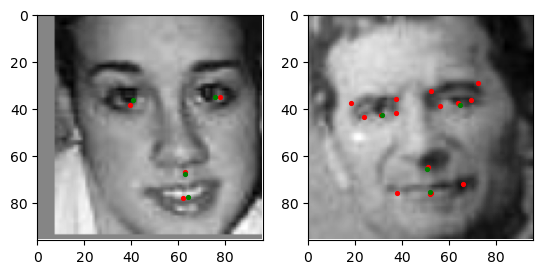


Epoch #: 44


100%|██████████| 419/419 [00:20<00:00, 20.09it/s]


Loss on train: 2.4876668408994815
Loss on val: 1.4539228874897268
LR features: 5e-05 LR regressor: 0.000125


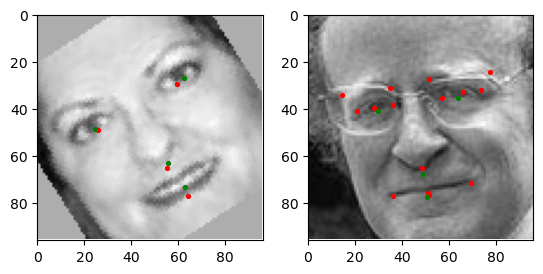


Epoch #: 45


100%|██████████| 419/419 [00:21<00:00, 19.53it/s]


Loss on train: 2.4708609105877124
Loss on val: 1.4454452752481475
LR features: 5e-05 LR regressor: 0.000125


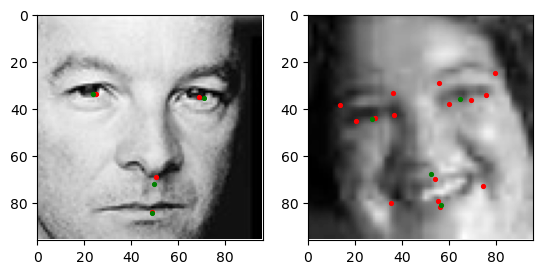


Epoch #: 46


100%|██████████| 419/419 [00:21<00:00, 19.84it/s]


Loss on train: 2.4948941136804543
Loss on val: 1.591608155798824
LR features: 5e-05 LR regressor: 0.000125


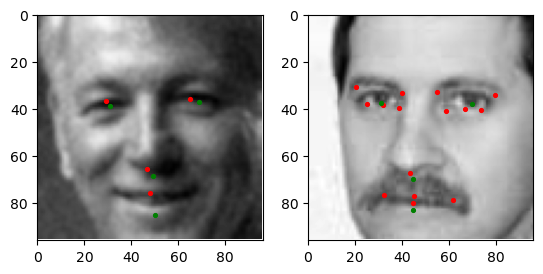


Epoch #: 47


100%|██████████| 419/419 [00:21<00:00, 19.46it/s]


Loss on train: 2.4768044345875997
Loss on val: 1.4887879160711635
LR features: 5e-05 LR regressor: 0.000125


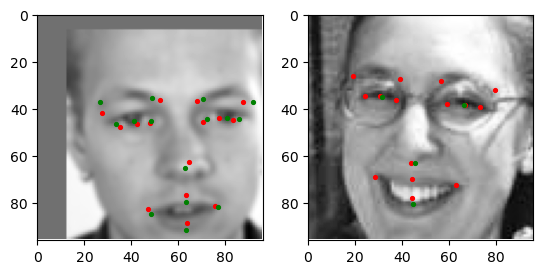


Epoch #: 48


100%|██████████| 419/419 [00:21<00:00, 19.44it/s]


Loss on train: 2.4244547813871264
Loss on val: 1.49169283085614
LR features: 5e-05 LR regressor: 0.000125


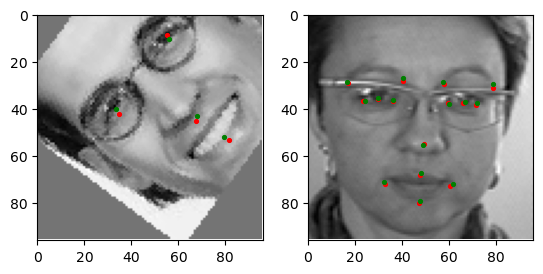


Epoch #: 49


100%|██████████| 419/419 [00:20<00:00, 20.11it/s]


Loss on train: 2.4682397432194074
Loss on val: 1.4280207334640027
LR features: 5e-05 LR regressor: 0.000125


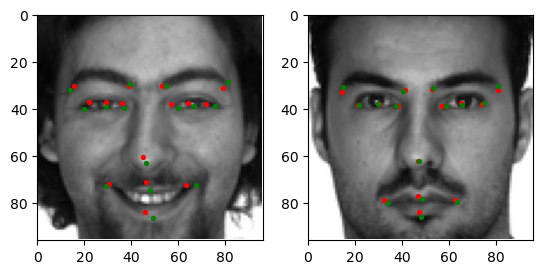


Epoch #: 50


100%|██████████| 419/419 [00:21<00:00, 19.34it/s]


Loss on train: 2.443257691569083
Loss on val: 1.4335892947474733
LR features: 2.5e-05 LR regressor: 6.25e-05


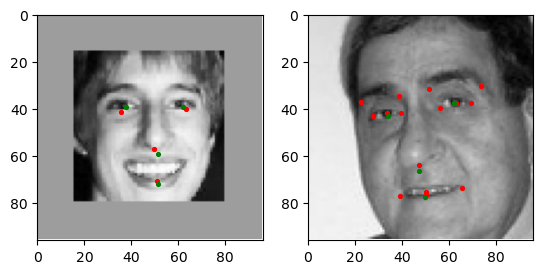


Epoch #: 51


100%|██████████| 419/419 [00:21<00:00, 19.83it/s]


Loss on train: 2.3774280756874187
Loss on val: 1.393648411526755
LR features: 2.5e-05 LR regressor: 6.25e-05


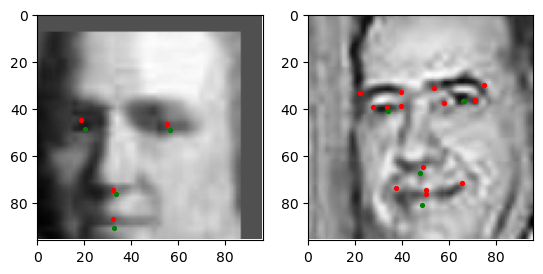


Epoch #: 52


100%|██████████| 419/419 [00:21<00:00, 19.77it/s]


Loss on train: 2.4737882395870354
Loss on val: 1.3996911904679485
LR features: 2.5e-05 LR regressor: 6.25e-05


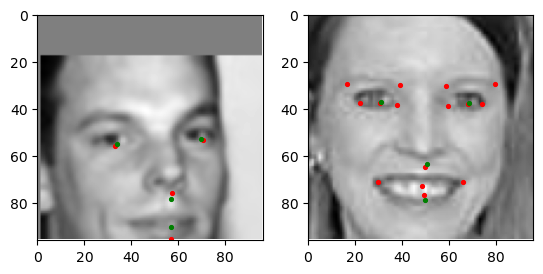


Epoch #: 53


100%|██████████| 419/419 [00:21<00:00, 19.46it/s]


Loss on train: 2.385047740133
Loss on val: 1.3897528755252888
LR features: 2.5e-05 LR regressor: 6.25e-05


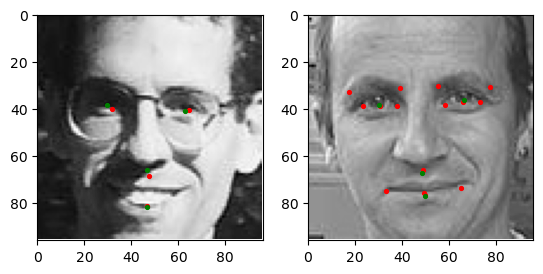


Epoch #: 54


100%|██████████| 419/419 [00:21<00:00, 19.52it/s]


Loss on train: 2.3586768853263815
Loss on val: 1.418046687823448
LR features: 2.5e-05 LR regressor: 6.25e-05


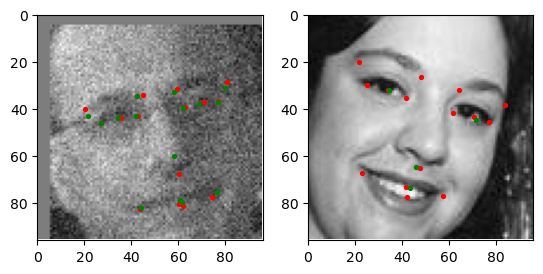


Epoch #: 55


100%|██████████| 419/419 [00:21<00:00, 19.88it/s]


Loss on train: 2.3268515516544586
Loss on val: 1.3921120332124082
LR features: 2.5e-05 LR regressor: 6.25e-05


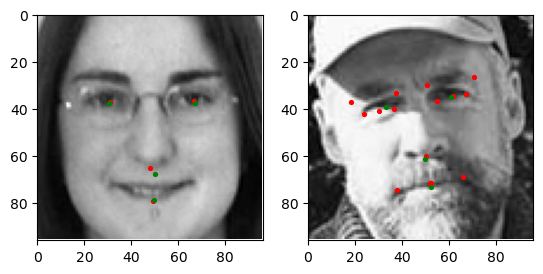


Epoch #: 56


100%|██████████| 419/419 [00:21<00:00, 19.19it/s]


Loss on train: 2.3650383144426317
Loss on val: 1.3801862968166838
LR features: 1.25e-05 LR regressor: 3.125e-05


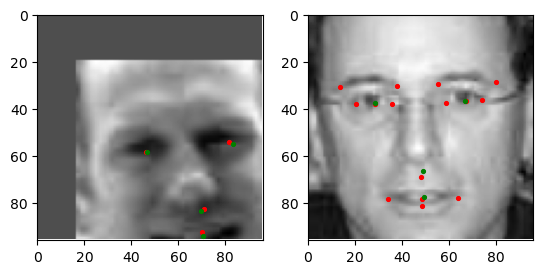


Epoch #: 57


100%|██████████| 419/419 [00:21<00:00, 19.73it/s]


Loss on train: 2.3486370865856503
Loss on val: 1.3796909653363427
LR features: 1.25e-05 LR regressor: 3.125e-05


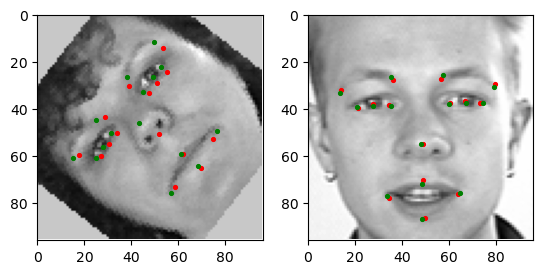


Epoch #: 58


100%|██████████| 419/419 [00:21<00:00, 19.41it/s]


Loss on train: 2.3695780000017788
Loss on val: 1.3793432974845967
LR features: 1.25e-05 LR regressor: 3.125e-05


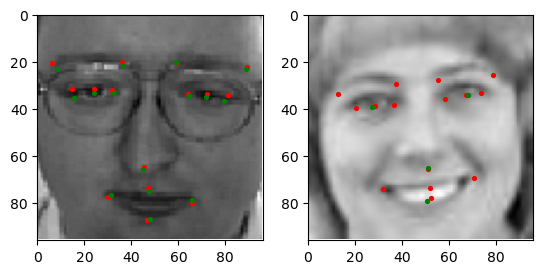


Epoch #: 59


100%|██████████| 419/419 [00:21<00:00, 19.15it/s]


Loss on train: 2.3588030741028754
Loss on val: 1.4002367826445994
LR features: 1.25e-05 LR regressor: 3.125e-05


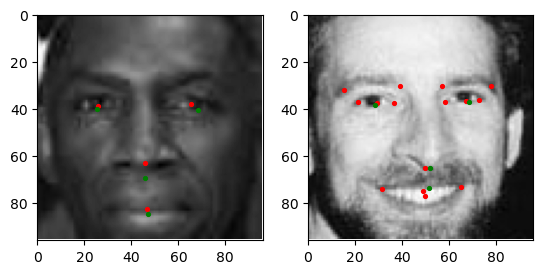


Epoch #: 60


100%|██████████| 419/419 [00:21<00:00, 19.36it/s]


Loss on train: 2.363336397074907
Loss on val: 1.3741728587619215
LR features: 1.25e-05 LR regressor: 3.125e-05


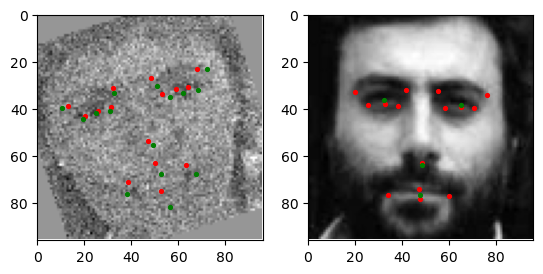


Epoch #: 61


100%|██████████| 419/419 [00:21<00:00, 19.30it/s]


Loss on train: 2.357058958250856
Loss on val: 1.420190336227442
LR features: 1e-05 LR regressor: 1.5625e-05


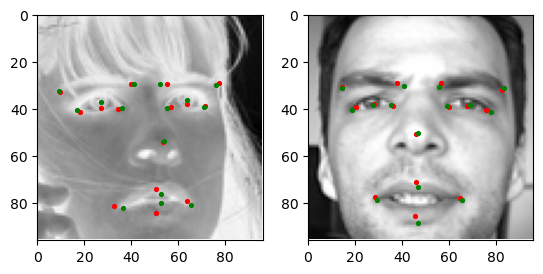


Epoch #: 62


100%|██████████| 419/419 [00:21<00:00, 19.78it/s]


Loss on train: 2.341374716657969
Loss on val: 1.375295469775685
LR features: 1e-05 LR regressor: 1.5625e-05


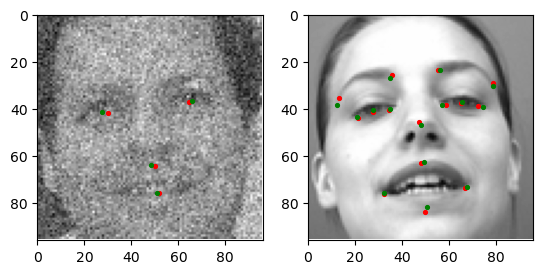


Epoch #: 63


100%|██████████| 419/419 [00:21<00:00, 19.40it/s]


Loss on train: 2.3253732887614498
Loss on val: 1.386116409900141
LR features: 1e-05 LR regressor: 1.5625e-05


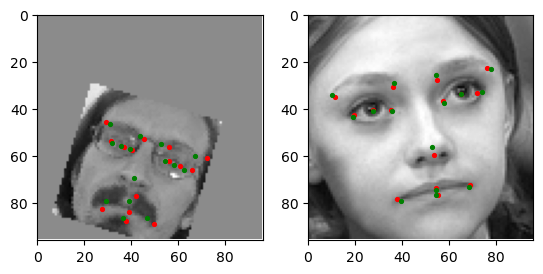


Epoch #: 64


100%|██████████| 419/419 [00:21<00:00, 19.60it/s]


Loss on train: 2.30353407723377
Loss on val: 1.3824944095313019
LR features: 1e-05 LR regressor: 1.5625e-05


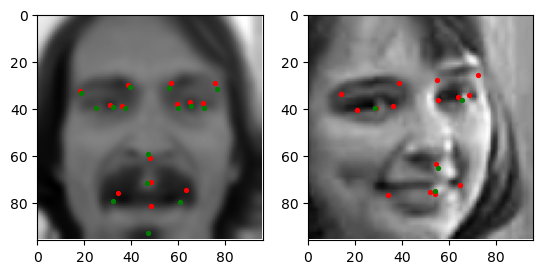


Epoch #: 65


100%|██████████| 419/419 [00:21<00:00, 19.31it/s]


Loss on train: 2.3167908677322795
Loss on val: 1.3864551114387191
LR features: 1e-05 LR regressor: 1.5625e-05


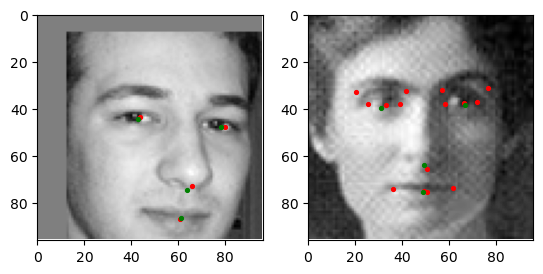


Epoch #: 66


100%|██████████| 419/419 [00:21<00:00, 19.64it/s]


Loss on train: 2.3424772873695474
Loss on val: 1.3873241382156851
LR features: 1e-05 LR regressor: 1e-05


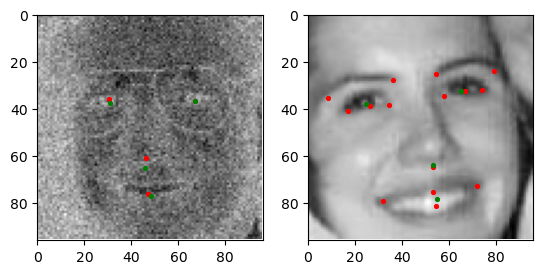


Epoch #: 67


100%|██████████| 419/419 [00:21<00:00, 19.28it/s]


Loss on train: 2.357367602754518
Loss on val: 1.3814789652050716
LR features: 1e-05 LR regressor: 1e-05


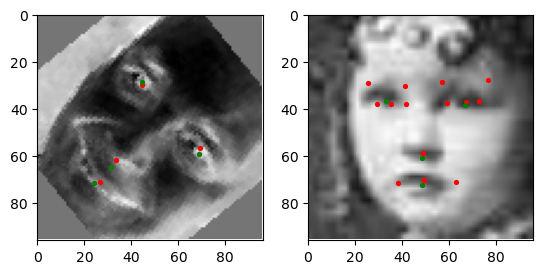


Epoch #: 68


100%|██████████| 419/419 [00:21<00:00, 19.35it/s]


Loss on train: 2.3054987597032484
Loss on val: 1.3756993523498657
LR features: 1e-05 LR regressor: 1e-05


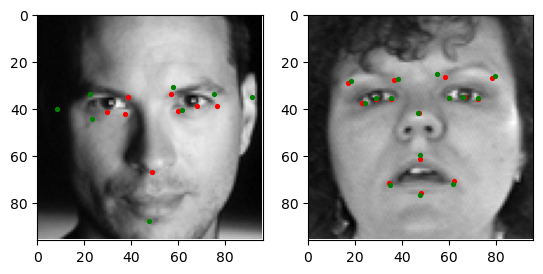


Epoch #: 69


100%|██████████| 419/419 [00:22<00:00, 18.63it/s]


Loss on train: 2.3062906668919196
Loss on val: 1.3784102427841278
LR features: 1e-05 LR regressor: 1e-05


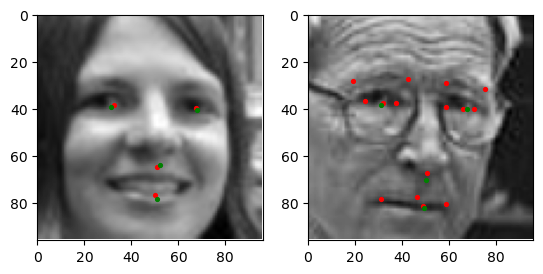


Epoch #: 70


100%|██████████| 419/419 [00:22<00:00, 18.96it/s]


Loss on train: 2.296871383099004
Loss on val: 1.3728273259076718
LR features: 1e-05 LR regressor: 1e-05


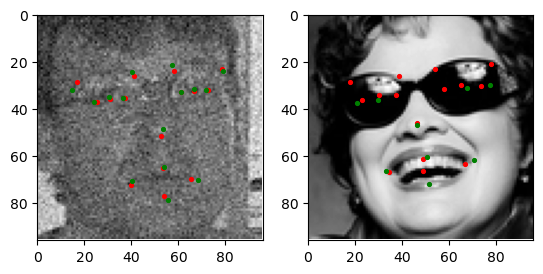


Epoch #: 71


100%|██████████| 419/419 [00:22<00:00, 18.82it/s]


Loss on train: 2.2959008965669736
Loss on val: 1.3877508409422636
LR features: 1e-05 LR regressor: 1e-05


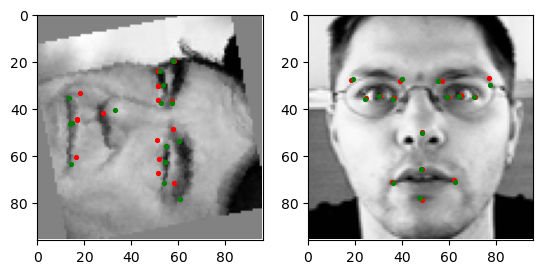


Epoch #: 72


100%|██████████| 419/419 [00:21<00:00, 19.06it/s]


Loss on train: 2.3129051313576223
Loss on val: 1.3744833225466588
LR features: 1e-05 LR regressor: 1e-05


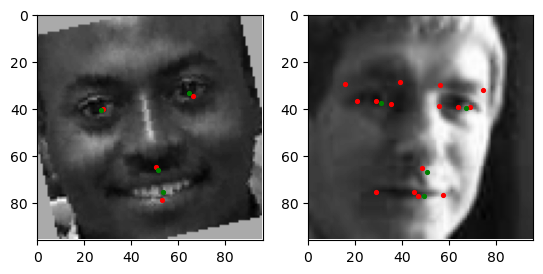


Epoch #: 73


100%|██████████| 419/419 [00:21<00:00, 19.06it/s]


Loss on train: 2.3222559029370817
Loss on val: 1.3733528126354089
LR features: 1e-05 LR regressor: 1e-05


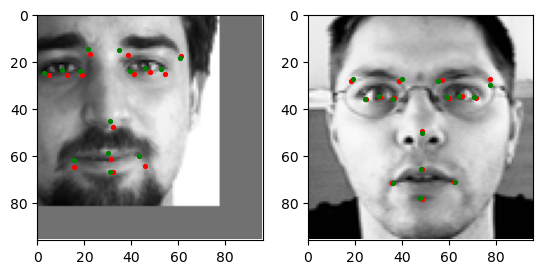


Epoch #: 74


100%|██████████| 419/419 [00:21<00:00, 19.63it/s]


Loss on train: 2.290687078593171
Loss on val: 1.3674677444612977
LR features: 1e-05 LR regressor: 1e-05


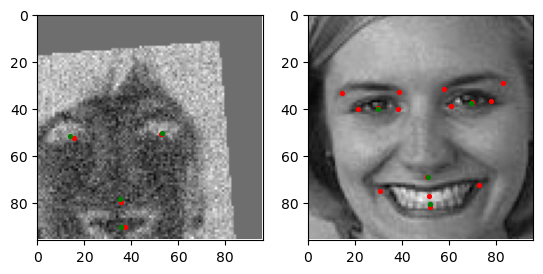


Epoch #: 75


100%|██████████| 419/419 [00:21<00:00, 19.36it/s]


Loss on train: 2.2867640653702166
Loss on val: 1.3877426795337657
LR features: 1e-05 LR regressor: 1e-05


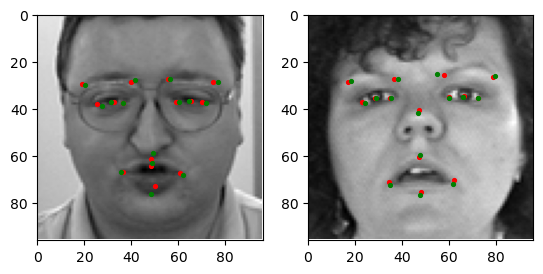


Epoch #: 76


100%|██████████| 419/419 [00:21<00:00, 19.66it/s]


Loss on train: 2.2786995813680506
Loss on val: 1.3988744685660417
LR features: 1e-05 LR regressor: 1e-05


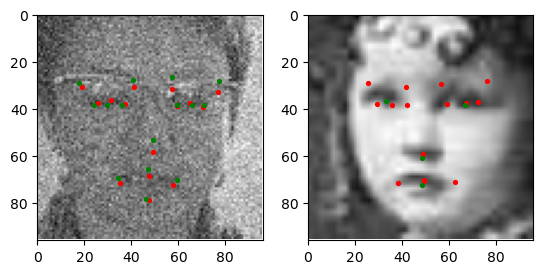


Epoch #: 77


100%|██████████| 419/419 [00:21<00:00, 19.06it/s]


Loss on train: 2.330039808222816
Loss on val: 1.3785175898972652
LR features: 1e-05 LR regressor: 1e-05


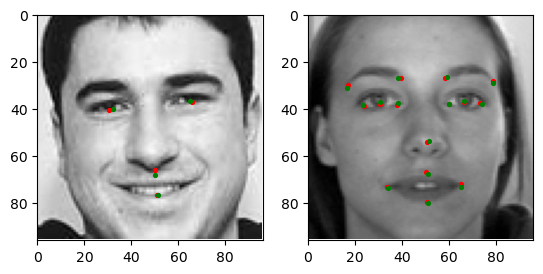


Epoch #: 78


100%|██████████| 419/419 [00:21<00:00, 19.25it/s]


Loss on train: 2.29199089020744
Loss on val: 1.367065348758661
LR features: 1e-05 LR regressor: 1e-05


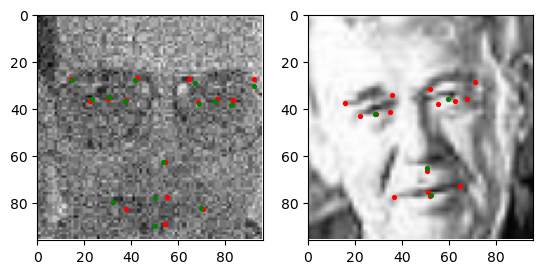


Epoch #: 79


100%|██████████| 419/419 [00:21<00:00, 19.78it/s]


Loss on train: 2.3024343848343056
Loss on val: 1.3693725627057212
LR features: 1e-05 LR regressor: 1e-05


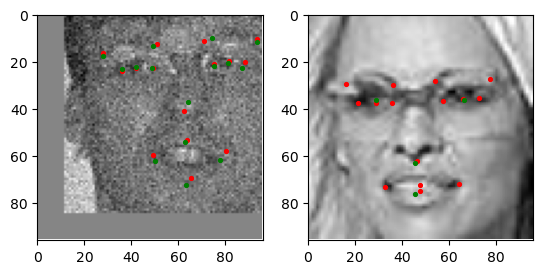


Epoch #: 80


100%|██████████| 419/419 [00:21<00:00, 19.28it/s]


Loss on train: 2.2859226918744215
Loss on val: 1.4129085987074022
LR features: 1e-05 LR regressor: 1e-05


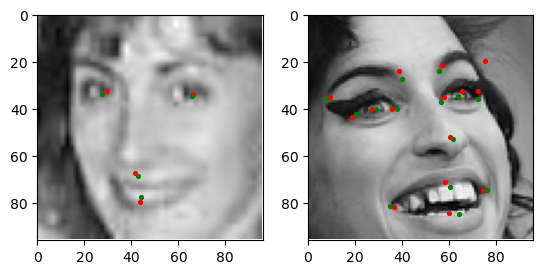


Epoch #: 81


100%|██████████| 419/419 [00:21<00:00, 19.92it/s]


Loss on train: 2.3132657067647218
Loss on val: 1.3729368262338402
LR features: 1e-05 LR regressor: 1e-05


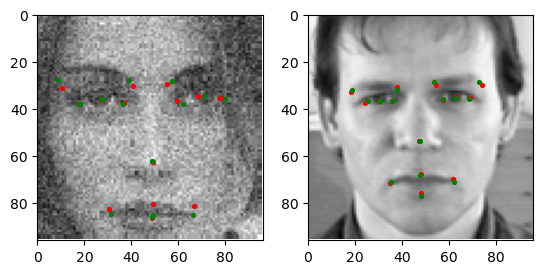


Epoch #: 82


100%|██████████| 419/419 [00:22<00:00, 18.99it/s]


Loss on train: 2.264852098588808
Loss on val: 1.3782275540229367
LR features: 1e-05 LR regressor: 1e-05


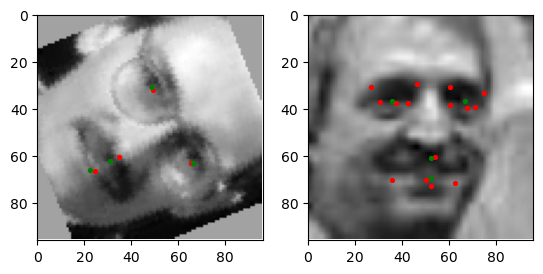


Epoch #: 83


100%|██████████| 419/419 [00:21<00:00, 19.06it/s]


Loss on train: 2.321792094640876
Loss on val: 1.3870230852230043
LR features: 1e-05 LR regressor: 1e-05


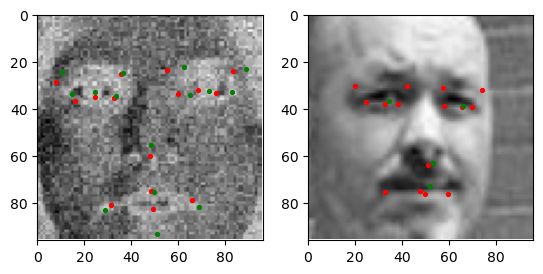


Epoch #: 84


100%|██████████| 419/419 [00:21<00:00, 19.28it/s]


Loss on train: 2.283417823188526
Loss on val: 1.387956222256703
LR features: 1e-05 LR regressor: 1e-05


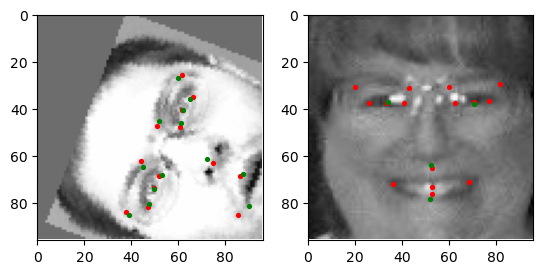


Epoch #: 85


100%|██████████| 419/419 [00:21<00:00, 19.71it/s]


Loss on train: 2.2907939985904107
Loss on val: 1.3674010697098729
LR features: 1e-05 LR regressor: 1e-05


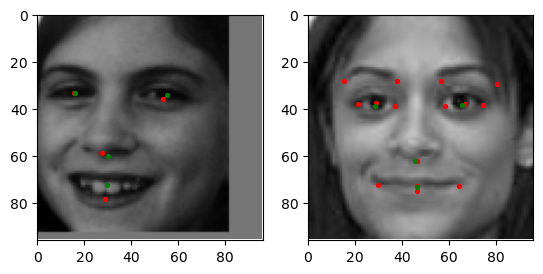


Epoch #: 86


100%|██████████| 419/419 [00:21<00:00, 19.16it/s]


Loss on train: 2.3457189087874752
Loss on val: 1.391492057739172
LR features: 1e-05 LR regressor: 1e-05


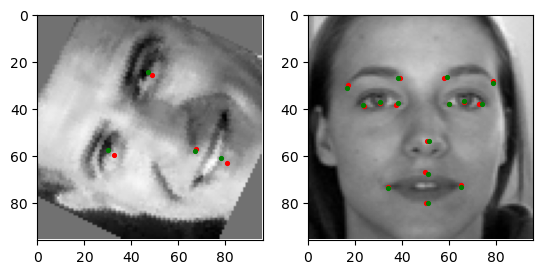


Epoch #: 87


100%|██████████| 419/419 [00:21<00:00, 19.70it/s]


Loss on train: 2.3465680722465008
Loss on val: 1.3718565882589557
LR features: 1e-05 LR regressor: 1e-05


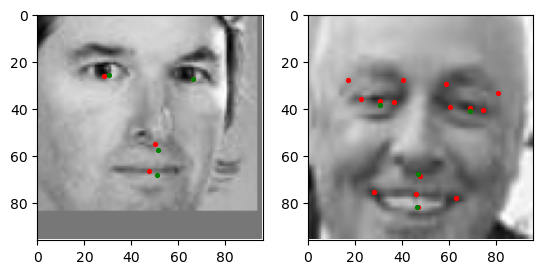


Epoch #: 88


100%|██████████| 419/419 [00:21<00:00, 19.30it/s]


Loss on train: 2.282453980421018
Loss on val: 1.3686800884386707
LR features: 1e-05 LR regressor: 1e-05


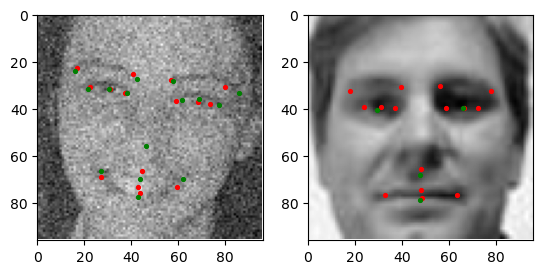


Epoch #: 89


100%|██████████| 419/419 [00:21<00:00, 19.15it/s]


Loss on train: 2.3382293378197274
Loss on val: 1.3592447302205368
LR features: 1e-05 LR regressor: 1e-05


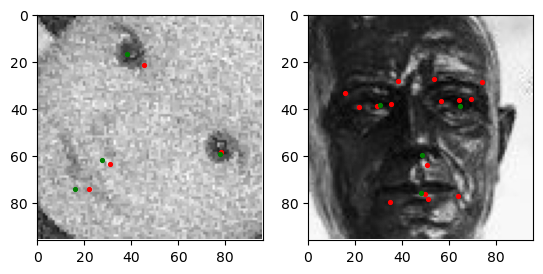


Epoch #: 90


100%|██████████| 419/419 [00:21<00:00, 19.73it/s]


Loss on train: 2.2763030232924173
Loss on val: 1.3727616373117992
LR features: 1e-05 LR regressor: 1e-05


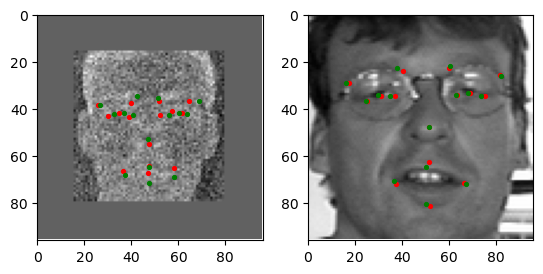


Epoch #: 91


100%|██████████| 419/419 [00:21<00:00, 19.53it/s]


Loss on train: 2.336159457950336
Loss on val: 1.360872750461958
LR features: 1e-05 LR regressor: 1e-05


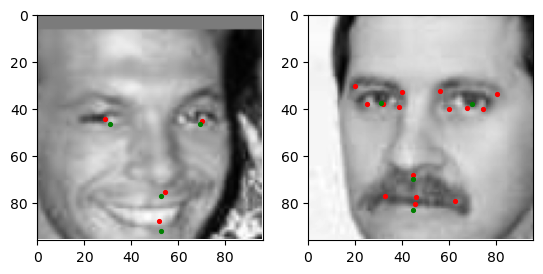


Epoch #: 92


100%|██████████| 419/419 [00:21<00:00, 19.90it/s]


Loss on train: 2.28724630548807
Loss on val: 1.3630959259522808
LR features: 1e-05 LR regressor: 1e-05


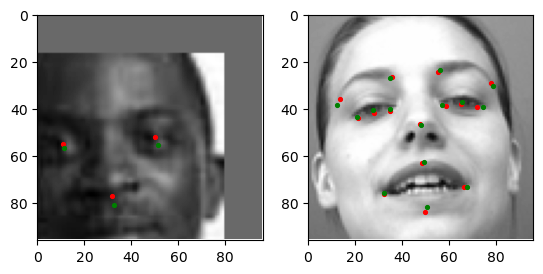


Epoch #: 93


100%|██████████| 419/419 [00:21<00:00, 19.45it/s]


Loss on train: 2.3159098212736113
Loss on val: 1.3642924599978414
LR features: 1e-05 LR regressor: 1e-05


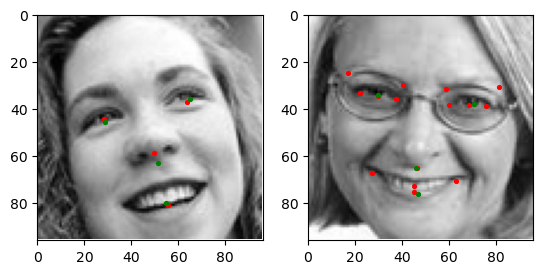


Epoch #: 94


100%|██████████| 419/419 [00:21<00:00, 19.63it/s]


Loss on train: 2.248183672889957
Loss on val: 1.361835425047876
LR features: 1e-05 LR regressor: 1e-05


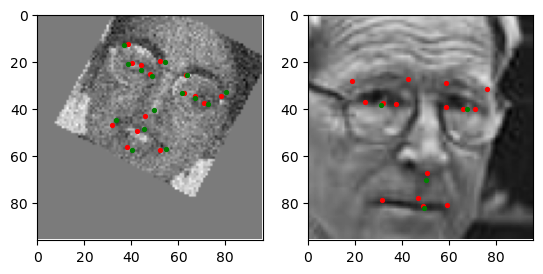


Epoch #: 95


100%|██████████| 419/419 [00:21<00:00, 19.92it/s]


Loss on train: 2.2916602764307505
Loss on val: 1.3639133010573607
LR features: 1e-05 LR regressor: 1e-05


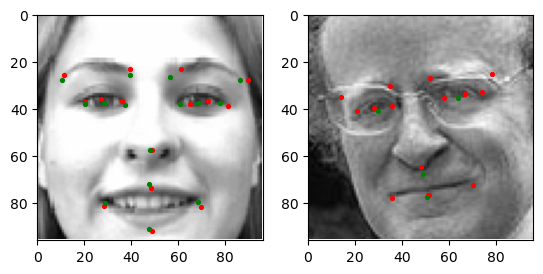


Epoch #: 96


100%|██████████| 419/419 [00:21<00:00, 19.79it/s]


Loss on train: 2.27942486244707
Loss on val: 1.350280195706319
LR features: 1e-05 LR regressor: 1e-05


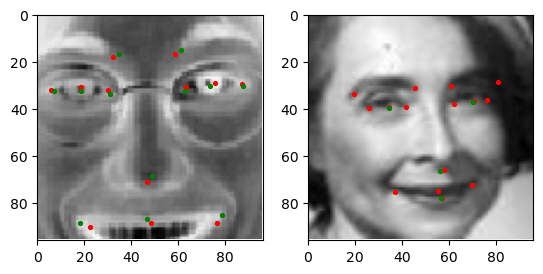


Epoch #: 97


100%|██████████| 419/419 [00:20<00:00, 20.02it/s]


Loss on train: 2.2715400801090793
Loss on val: 1.3711654738951606
LR features: 1e-05 LR regressor: 1e-05


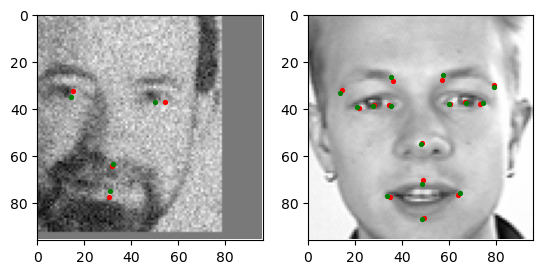


Epoch #: 98


100%|██████████| 419/419 [00:21<00:00, 19.69it/s]


Loss on train: 2.2856265216189615
Loss on val: 1.378181071872901
LR features: 1e-05 LR regressor: 1e-05


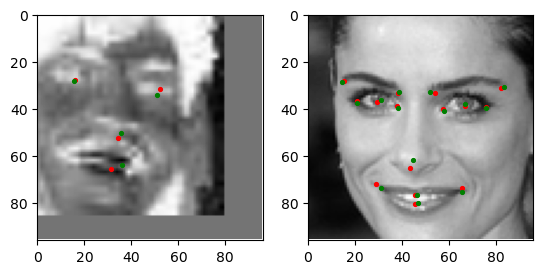


Epoch #: 99


100%|██████████| 419/419 [00:21<00:00, 19.60it/s]


Loss on train: 2.318611585982194
Loss on val: 1.3699025153865763
LR features: 1e-05 LR regressor: 1e-05


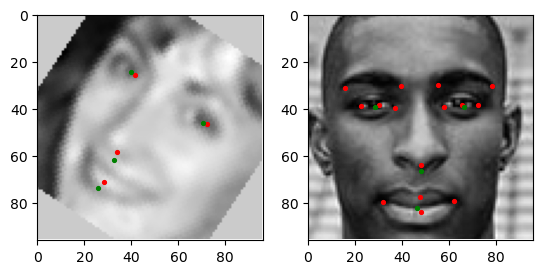

In [15]:
def train_one_epoch(train_loader, test_loader, model, criterion, optimizer, scheduler):
    # Calculate validation loss, adjust learning rate, and show images
    
    # Calculate validation loss
    num_examples = 0
    val_losses = []
    model.eval()
    with torch.no_grad():                
        for val_images, val_labels in test_loader:
            # Perform a forward pass through the model to obtain predictions
            val_preds = model(val_images)
            # Calculate the loss, ignoring the 'target' values with value -1
            val_loss = criterion(val_preds[val_labels != -1], val_labels[val_labels != -1])
            num_examples += val_labels[val_labels != -1].shape[0]
            val_losses.append(val_loss.item())
    model.train()
    
    # Calculate the RMSE for validation loss
    val_losses_epoch = (sum(val_losses) / num_examples) ** 0.5 
    
    # Train the model on the training set
    
    num_examples = 0
    losses = []
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        preds = model(images)
        preds[labels == -1] = -1

        loss = criterion(preds[labels != -1], labels[labels != -1])

        num_examples += torch.numel(preds[labels != -1])
        losses.append(loss.item())

        loss.backward()
        optimizer.step()

    # Calculate the RMSE for training loss
    losses_epoch = (sum(losses) / num_examples) ** 0.5   
    
    # Print losses on training and validation sets
    print(f"Loss on train: {losses_epoch}")
    print(f"Loss on val: {val_losses_epoch}")      

    # Adjust learning rate using scheduler based on validation loss
    scheduler.step(val_losses_epoch)

    # Adjust weight decay based on learning rate
    lr_features = optimizer.param_groups[0]['lr']
    lr_regressor = optimizer.param_groups[1]['lr']
#     optimizer.param_groups[0]['weight_decay'] = lr_features / wd_factor
#     optimizer.param_groups[1]['weight_decay'] = lr_regressor / wd_factor

    print("LR features:", lr_features, "LR regressor:", lr_regressor)

    # Display the images
    show_images(img_size,
                images[0].cpu().detach().mean(0),
                labels.cpu().detach().numpy()[0],
                preds.cpu().detach().numpy()[0],
                val_images[0].cpu().detach().mean(0),
                val_labels.cpu().detach().numpy()[0],
                val_preds.cpu().detach().numpy()[0])

    return losses_epoch, val_losses_epoch


lr_f = 0.0002
lr_reg = 0.0005
# wd_factor = 15
optimizer = optim.Adam([
    {'params': model.effnet.features.parameters(), 'lr': lr_f},
    {'params': model.regressor.parameters(), 'lr': lr_reg}
])
criterion = nn.MSELoss(reduction="sum")
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=4, factor=0.5, threshold=0.03, min_lr=1e-5)

train_loss_history = []
val_loss_history = []

for epoch in range(100):
    print('Epoch #:', epoch)
    train_loss, val_loss = train_one_epoch(train_loader, test_loader, model, criterion, optimizer, scheduler)
    train_loss_history.append(train_loss)
    val_loss_history.append(val_loss)
    if epoch%5==0:
        submission_result = save_predictions(model, img_submission, IdLookupTable)
    print('')

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(epoch)), y=list(val_loss_history),
                    mode='lines+markers',
                    name='validation loss'))
fig.add_trace(go.Scatter(x=list(range(epoch)), y=list([x for x in train_loss_history]),
                    mode='lines+markers', name='train loss'))
fig.update_layout(
    title="Loss over epochs",
    xaxis_title="Epoch #",
    yaxis_title="RMSE",
    legend_title="Losses",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)

fig.show()

In [17]:
submission = save_predictions(model, img_submission, IdLookupTable)

In [18]:
submission.to_csv('/kaggle/working/submission.csv',index = False)